In [1]:
import json
from typing import List, Tuple

import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
from rich import print
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
from PIL import Image

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import FashionIQDataset, targetpad_transform
from src.combiner import Combiner
from src.utils import extract_index_features, device, extract_index_features_with_text_captions
from src.validate import generate_fiq_val_predictions

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Modify the function for calculation in different alpha values</div>

# <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform alpha search for the best alpha value after the search and index were encoded</div>

In [2]:
def compute_fiq_val_metrics_text_image_modified(
    relative_val_dataset: FashionIQDataset,
    blip_text_encoder: torch.nn.Module,
    multiple_text_index_features: List[torch.tensor],
    multiple_text_index_names: List[List[str]],
    image_index_features: torch.tensor,
    image_index_names: List[str],
    combining_function: callable
) -> pd.DataFrame:
    """
    Compute validation metrics on FashionIQ dataset combining text and image distances.

    :param relative_val_dataset: FashionIQ validation dataset in relative mode
    :param blip_text_encoder: BLIP model
    :param multiple_text_index_features: validation index features from text
    :param multiple_text_index_names: validation index names from text
    :param image_index_features: validation image index features
    :param image_index_names: validation image index names
    :param combining_function: function that combines features
    :return: the computed validation metrics
    """
    all_text_distances = []
    results = []
    alphas = np.arange(0, 1.05, 0.05)
    target_names = None

    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(
            blip_text_encoder, relative_val_dataset,
            combining_function, text_names, text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    # Normalize and compute distances for image features if available
    if image_index_features is not None and len(image_index_features) > 0:
        predicted_image_features, _ = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                   combining_function, image_index_names,
                                                                   image_index_features)

        # Normalize and compute distances
        image_index_features = F.normalize(image_index_features, dim=-1).float()
        image_distances = 1 - predicted_image_features @ image_index_features.T
    else:
        image_distances = torch.zeros_like(all_text_distances[0])

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)

    # Iterating over alpha values
    for alpha in alphas:
        merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
        sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
        sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
        labels = torch.tensor(
            sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
        assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
        recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
        recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
        results.append({"alpha": alpha, "recall_at10": recall_at10, "recall_at50": recall_at50})

    return pd.DataFrame(results)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">The only diffence is remove alpha parameter from the function</div>

In [3]:
def fashioniq_val_retrieval_text_image_modified(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable):
    """
    Perform retrieval on FashionIQ validation set computing the metrics. To combine the features the `combining_function`
    is used
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined  features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    """

    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()

    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)

    multiple_index_features, multiple_index_names = [], []

    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_index_features.append(index_features)
        multiple_index_names.append(index_names)

    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)

    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)

    return compute_fiq_val_metrics_text_image_modified(
        relative_val_dataset,
        blip_text_encoder,
        multiple_index_features,
        multiple_index_names,
        image_index_features,
        image_index_names,
        combining_function
    )

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the BLIP model and the Combiner</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [4]:
BLIP_PRETRAINED_PATH = '../models/model_base_retrieval_flickr.pth'
MED_CONFIG_PATH = 'blip_modules/med_config.json'

In [5]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../models/model_base_retrieval_flickr.pth for text_encoder.
load checkpoint from ../models/model_base_retrieval_flickr.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [6]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH)
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder = blip_img_encoder.eval()

load checkpoint from ../models/model_base_retrieval_flickr.pth for visual_encoder.
load checkpoint from ../models/model_base_retrieval_flickr.pth for vision_proj.


blip img encoder loaded.

In [7]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [8]:
def element_wise_sum_original(image_features: torch.tensor, text_features: torch.tensor) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize(image_features + text_features, dim=-1)

In [9]:
combining_function_original = element_wise_sum_original

In [10]:
def element_wise_sum(image_features: torch.tensor, text_features: torch.tensor, beta=0.65) -> torch.tensor:
    """
    Normalized element-wise sum of image features and text features
    :param image_features: non-normalized image features
    :param text_features: non-normalized text features
    :param beta: weight for text features
    :return: normalized element-wise sum of image and text features
    """
    return F.normalize((1 - beta) * image_features + beta * text_features, dim=-1)

In [11]:
combining_function = lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=0.65)

In [12]:
def get_combing_function_with_beta(beta: float):
    return lambda image_features, text_features: element_wise_sum(image_features, text_features, beta=beta)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the FashionIQ dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions and perform retrieval on the FashionIQ dataset</div>

In [13]:
with open('../fashionIQ_dataset/labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
total_recall_list: List[List[pd.DataFrame]] = []

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to convert the list of DataFrames to a single DataFrame with a pivot table structure</div>

In [14]:
def convert_to_pivot(data: List[pd.DataFrame]) -> Tuple[pd.DataFrame, pd.DataFrame]:
    """
    Convert a list of DataFrames to a single DataFrame with a pivot table structure.
    :param data: list of DataFrames
    :param column_name: name of the column to use as the index
    :return: a single DataFrame with a pivot table structure
    """
    concatenated_data = []
    betas = np.arange(0, 1.05, 0.05)

    # Concatenate dataframes for all betas and add beta_index, beta_df in enumerate(data):
    for beta_index, beta_df in enumerate(data):
        beta_df['beta'] = round(betas[beta_index], 2)  # Round to two decimal places
        concatenated_data.append(beta_df)

    # Create one dataframe per category
    category_df = pd.concat(concatenated_data, ignore_index=True)
    
    # Create pivot tables for recall@10 and recall@50
    recall_at10 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at10')
    recall_at50 = category_df.pivot_table(index='alpha', columns='beta', values='recall_at50')
    
    return recall_at10, recall_at50

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the shirt category</div>

In [15]:
grid_search_betas = np.arange(0, 1.05, 0.05)
shirt_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    shirt_recall = fashioniq_val_retrieval_text_image_modified(
        'shirt',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Shirt recall at 10 for beta={beta}: {shirt_recall['recall_at10'].max()}")
    print(f"Shirt recall at 50 for beta={beta}: {shirt_recall['recall_at50'].max()}")
    
    shirt_recall_list.append(shirt_recall)
    
shirt_recall_at10, shirt_recall_at50 = convert_to_pivot(shirt_recall_list)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:58<00:00,  3.42it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 18:55:16.188713] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.21it/s]


[2024-05-12 18:55:17.339613] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.51it/s]


[2024-05-12 18:55:18.441393] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.46it/s]


[2024-05-12 18:55:19.526019] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.42it/s]


Shirt recall at 10 for beta=0.0: 7.899902015924454

Shirt recall at 50 for beta=0.0: 18.25318932533264

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:57<00:00,  3.48it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 18:57:08.111093] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.36it/s]


[2024-05-12 18:57:09.257233] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.65it/s]


[2024-05-12 18:57:10.395395] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.08it/s]


[2024-05-12 18:57:11.545099] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.96it/s]


Shirt recall at 10 for beta=0.05: 7.998037338256836

Shirt recall at 50 for beta=0.05: 18.842001259326935

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:57<00:00,  3.45it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 18:59:03.449488] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.00it/s]


[2024-05-12 18:59:04.726156] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.01it/s]


[2024-05-12 18:59:05.991124] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.07it/s]


[2024-05-12 18:59:07.237953] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.57it/s]


Shirt recall at 10 for beta=0.1: 8.1943079829216

Shirt recall at 50 for beta=0.1: 19.185476005077362

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.51it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:01:07.003214] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.19it/s]


[2024-05-12 19:01:08.112238] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.88it/s]


[2024-05-12 19:01:09.189804] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.62it/s]


[2024-05-12 19:01:10.271459] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.83it/s]


Shirt recall at 10 for beta=0.15000000000000002: 8.537781983613968

Shirt recall at 50 for beta=0.15000000000000002: 19.823355972766876

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.56it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:02:54.727192] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.41it/s]


[2024-05-12 19:02:55.894745] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 62.12it/s]


[2024-05-12 19:02:56.932728] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.24it/s]


[2024-05-12 19:02:57.985768] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.73it/s]


Shirt recall at 10 for beta=0.2: 9.0775266289711

Shirt recall at 50 for beta=0.2: 20.363101363182068

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:04:40.711490] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.34it/s]


[2024-05-12 19:04:41.798694] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.20it/s]


[2024-05-12 19:04:42.887841] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.66it/s]


[2024-05-12 19:04:44.007763] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 62.24it/s]


Shirt recall at 10 for beta=0.25: 9.715407341718674

Shirt recall at 50 for beta=0.25: 21.88419997692108

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:06:27.813987] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.91it/s]


[2024-05-12 19:06:28.891328] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.80it/s]


[2024-05-12 19:06:29.951980] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.54it/s]


[2024-05-12 19:06:31.053158] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.57it/s]


Shirt recall at 10 for beta=0.30000000000000004: 10.696761310100555

Shirt recall at 50 for beta=0.30000000000000004: 23.748773336410522

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.57it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:08:17.012328] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.01it/s]


[2024-05-12 19:08:18.089435] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.64it/s]


[2024-05-12 19:08:19.136104] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.25it/s]


[2024-05-12 19:08:20.188641] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.49it/s]


Shirt recall at 10 for beta=0.35000000000000003: 11.923454701900482

Shirt recall at 50 for beta=0.35000000000000003: 24.92639869451523

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.57it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:10:03.945749] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.03it/s]


[2024-05-12 19:10:05.039729] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.66it/s]


[2024-05-12 19:10:06.102554] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.76it/s]


[2024-05-12 19:10:07.181486] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.47it/s]


Shirt recall at 10 for beta=0.4: 13.346418738365173

Shirt recall at 50 for beta=0.4: 27.134445309638977

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:11:51.097321] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.12it/s]


[2024-05-12 19:11:52.171279] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.83it/s]


[2024-05-12 19:11:53.214920] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.79it/s]


[2024-05-12 19:11:54.275618] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.78it/s]


Shirt recall at 10 for beta=0.45: 15.112856030464172

Shirt recall at 50 for beta=0.45: 30.225712060928345

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.58it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:13:38.173097] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.23it/s]


[2024-05-12 19:13:39.359762] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.69it/s]


[2024-05-12 19:13:40.440392] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.90it/s]


[2024-05-12 19:13:41.517491] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.31it/s]


Shirt recall at 10 for beta=0.5: 17.32090264558792

Shirt recall at 50 for beta=0.5: 32.531893253326416

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.57it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:15:25.482363] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.16it/s]


[2024-05-12 19:15:26.592263] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.14it/s]


[2024-05-12 19:15:27.682379] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.12it/s]


[2024-05-12 19:15:28.810747] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.41it/s]


Shirt recall at 10 for beta=0.55: 19.430814683437347

Shirt recall at 50 for beta=0.55: 34.838077425956726

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:55<00:00,  3.59it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:17:12.633265] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.78it/s]


[2024-05-12 19:17:13.695178] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.12it/s]


[2024-05-12 19:17:14.768160] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.69it/s]


[2024-05-12 19:17:15.848518] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.85it/s]


Shirt recall at 10 for beta=0.6000000000000001: 20.85377871990204

Shirt recall at 50 for beta=0.6000000000000001: 36.997056007385254

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.53it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:19:00.782310] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 61.70it/s]


[2024-05-12 19:19:01.827852] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 60.47it/s]


[2024-05-12 19:19:02.896040] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.37it/s]


[2024-05-12 19:19:03.981992] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.55it/s]


Shirt recall at 10 for beta=0.65: 22.32580929994583

Shirt recall at 50 for beta=0.65: 38.51815462112427

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:56<00:00,  3.51it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:20:49.264338] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.12it/s]


[2024-05-12 19:20:50.393579] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.49it/s]


[2024-05-12 19:20:51.576541] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.10it/s]


[2024-05-12 19:20:52.768817] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.57it/s]


Shirt recall at 10 for beta=0.7000000000000001: 23.25809597969055

Shirt recall at 50 for beta=0.7000000000000001: 40.08832275867462

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:02<00:00,  3.19it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:22:43.676912] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.00it/s]


[2024-05-12 19:22:44.870745] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.76it/s]


[2024-05-12 19:22:46.069654] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.87it/s]


[2024-05-12 19:22:47.267101] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.72it/s]


Shirt recall at 10 for beta=0.75: 23.846909403800964

Shirt recall at 50 for beta=0.75: 40.77526926994324

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:59<00:00,  3.37it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:24:34.959107] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.98it/s]


[2024-05-12 19:24:36.071912] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.21it/s]


[2024-05-12 19:24:37.264312] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.22it/s]


[2024-05-12 19:24:38.372573] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.35it/s]


Shirt recall at 10 for beta=0.8: 24.435721337795258

Shirt recall at 50 for beta=0.8: 41.65848791599274

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [00:57<00:00,  3.47it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:26:25.930430] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.72it/s]


[2024-05-12 19:26:27.030991] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.51it/s]


[2024-05-12 19:26:28.114612] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 58.46it/s]


[2024-05-12 19:26:29.217513] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 59.57it/s]


Shirt recall at 10 for beta=0.8500000000000001: 25.41707456111908

Shirt recall at 50 for beta=0.8500000000000001: 42.63984262943268

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:01<00:00,  3.21it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:28:22.109007] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.53it/s]


[2024-05-12 19:28:23.291190] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.10it/s]


[2024-05-12 19:28:24.461530] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.06it/s]


[2024-05-12 19:28:25.653424] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.80it/s]


Shirt recall at 10 for beta=0.9: 27.18351185321808

Shirt recall at 50 for beta=0.9: 44.01373863220215

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:01<00:00,  3.25it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:30:15.141002] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.21it/s]


[2024-05-12 19:30:16.308997] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.17it/s]


[2024-05-12 19:30:17.476936] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.25it/s]


[2024-05-12 19:30:18.643284] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.28it/s]


Shirt recall at 10 for beta=0.9500000000000001: 27.28164792060852

Shirt recall at 50 for beta=0.9500000000000001: 43.71933341026306

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:01<00:00,  3.23it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 19:32:08.688775] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.00it/s]


[2024-05-12 19:32:09.861258] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.81it/s]


[2024-05-12 19:32:11.037272] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.56it/s]


[2024-05-12 19:32:12.218249] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.84it/s]


Shirt recall at 10 for beta=1.0: 23.20902794599533

Shirt recall at 50 for beta=1.0: 37.34053075313568

In [16]:
shirt_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,7.458293,7.507360,7.605495,7.850834,7.948969,7.998037,7.998037,8.145241,8.292443,8.341511,...,9.175663,9.568204,10.107949,11.089303,12.217861,13.935231,17.419039,22.129539,25.515211,20.657508
0.05,7.899902,7.948969,8.194308,8.292443,8.292443,8.292443,8.439647,8.586850,8.783121,8.979391,...,10.009813,10.893033,11.383709,11.874387,13.248283,15.309127,19.578017,23.159961,26.054955,21.982336
0.10,7.703631,7.899902,7.998037,8.096173,8.292443,8.390579,8.488715,8.832189,9.322865,9.862611,...,10.893033,11.334642,12.315996,13.444553,14.720315,17.271835,20.755643,24.582924,27.085379,22.080471
0.15,7.654563,7.850834,8.096173,8.243376,8.390579,8.684985,9.077527,9.568204,9.764475,10.353287,...,11.530913,12.414131,13.640824,14.867517,16.683023,18.792935,22.178607,26.153091,27.281648,22.816487
0.20,7.752699,7.850834,8.096173,8.194308,8.537782,9.077527,9.666339,10.058881,10.598626,11.236507,...,12.757605,13.935231,14.965652,16.732091,18.596664,20.706575,23.748773,26.054955,27.085379,23.209028
0.25,7.850834,7.998037,8.145241,8.292443,8.734053,9.322865,10.009813,10.647694,11.236507,11.825319,...,13.788028,15.161924,16.339548,17.909716,19.872424,22.227675,24.582924,26.545632,26.692837,23.110893
0.30,7.654563,7.948969,8.194308,8.390579,8.586850,9.371933,9.911678,10.647694,11.530913,12.463199,...,14.916585,16.192345,17.909716,19.185476,20.853779,23.012757,25.122669,27.183512,26.202160,22.865555
0.35,7.311089,7.752699,8.096173,8.439647,8.734053,9.421001,10.009813,10.794897,11.776251,12.953876,...,15.652600,17.320903,18.645731,20.264965,22.178607,23.945044,25.417075,26.251227,25.760549,23.012757
0.40,7.556428,7.752699,8.047105,8.439647,8.979391,9.666339,9.960746,10.942100,12.021590,13.444553,...,16.290481,17.713444,19.283612,21.000981,22.718351,24.288519,25.417075,25.858685,25.318941,22.767419


In [17]:
shirt_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,17.124632,17.222768,17.271835,17.369971,17.517173,17.713444,17.909716,18.253189,18.400392,18.940137,...,19.479883,20.166831,21.000981,22.423945,23.994112,27.183512,30.961728,37.880275,41.903827,34.739941
0.05,17.811580,17.909716,18.204121,18.351325,18.645731,18.891069,19.136408,19.578017,19.970560,20.657508,...,21.442591,22.227675,23.159961,24.288519,26.594701,29.244357,33.758587,39.352307,42.934248,35.377821
0.10,18.253189,18.694799,19.185476,19.676153,20.068695,20.215897,20.461236,21.099117,21.393523,21.835132,...,23.209028,23.994112,25.122669,26.987243,28.459275,31.550539,35.819432,40.873405,43.130520,36.015701
0.15,18.056919,18.842001,19.087340,19.725221,20.019627,20.363101,21.148184,21.982336,22.374877,22.963689,...,25.073603,26.153091,27.330717,28.851816,30.863592,34.102061,37.536800,42.247301,43.473995,36.359176
0.20,18.007851,18.645731,19.136408,19.823356,20.264965,21.000981,21.933268,22.865555,23.601571,24.582924,...,26.202160,27.526987,28.802747,30.520117,33.071640,35.328755,39.450443,43.130520,43.719333,36.800784
0.25,17.566241,18.204121,18.842001,19.528949,20.363101,21.197252,22.374877,23.356232,24.533857,25.318941,...,27.576056,28.655544,30.471051,32.630029,34.592739,37.487733,40.677133,43.572131,43.032384,37.291461
0.30,17.419039,17.958783,18.449460,19.332679,20.019627,21.295388,22.767419,23.945044,25.024533,25.662413,...,29.097155,30.520117,32.531893,34.052992,36.898920,38.959765,41.560352,43.523061,42.443573,37.291461
0.35,16.977429,17.860648,18.351325,19.430815,20.166831,21.786065,23.307164,24.239451,25.368008,26.790971,...,29.980373,32.188421,34.249264,36.555445,38.272816,40.235525,42.051029,44.013739,41.658488,37.340531
0.40,16.830225,17.517173,18.105987,19.087340,20.314033,21.884200,23.748773,24.828263,25.907752,27.674189,...,31.354269,33.562315,35.721296,37.536800,39.352307,40.873405,42.443573,43.228656,41.069677,37.193328


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the dress category</div>

In [18]:
grid_search_betas = np.arange(0, 1.05, 0.05)
dress_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    dress_recall = fashioniq_val_retrieval_text_image_modified(
        'dress',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"Dress recall at 10 for beta={beta}: {dress_recall['recall_at10'].max()}")
    print(f"Dress recall at 50 for beta={beta}: {dress_recall['recall_at50'].max()}")
    
    dress_recall_list.append(dress_recall)

dress_recall_at10, dress_recall_at50 = convert_to_pivot(dress_recall_list)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:33:29.807177] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.11it/s]


[2024-05-12 19:33:30.975607] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


[2024-05-12 19:33:32.128384] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.33it/s]


[2024-05-12 19:33:33.270722] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.80it/s]


Dress recall at 10 for beta=0.0: 4.908279702067375

Dress recall at 50 for beta=0.0: 12.394645810127258

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:34:35.608366] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.86it/s]


[2024-05-12 19:34:36.742300] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.13it/s]


[2024-05-12 19:34:37.868647] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.72it/s]


[2024-05-12 19:34:39.002658] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.15it/s]


Dress recall at 10 for beta=0.05: 5.057015269994736

Dress recall at 50 for beta=0.05: 12.79127448797226

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:35:41.434090] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.80it/s]


[2024-05-12 19:35:42.566936] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.49it/s]


[2024-05-12 19:35:43.687050] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.22it/s]


[2024-05-12 19:35:44.831922] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.63it/s]


Dress recall at 10 for beta=0.1: 5.106594040989876

Dress recall at 50 for beta=0.1: 12.9895880818367

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.58it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:36:47.305035] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.75it/s]


[2024-05-12 19:36:48.459726] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.84it/s]


[2024-05-12 19:36:49.710283] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.62it/s]


[2024-05-12 19:36:50.867542] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.31it/s]


Dress recall at 10 for beta=0.15000000000000002: 5.354486778378487

Dress recall at 50 for beta=0.15000000000000002: 13.336639106273651

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:37:53.325388] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.38it/s]


[2024-05-12 19:37:54.467466] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.77it/s]


[2024-05-12 19:37:55.581359] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.66it/s]


[2024-05-12 19:37:56.737065] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.54it/s]


Dress recall at 10 for beta=0.2: 5.602379888296127

Dress recall at 50 for beta=0.2: 13.832424581050873

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.57it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:38:59.345405] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.22it/s]


[2024-05-12 19:39:00.471505] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.41it/s]


[2024-05-12 19:39:01.592140] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.13it/s]


[2024-05-12 19:39:02.738579] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.75it/s]


Dress recall at 10 for beta=0.25: 5.751115456223488

Dress recall at 50 for beta=0.25: 14.476945996284485

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:40:05.119450] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.47it/s]


[2024-05-12 19:40:06.240299] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.46it/s]


[2024-05-12 19:40:07.360424] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.33it/s]


[2024-05-12 19:40:08.502639] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.15it/s]


Dress recall at 10 for beta=0.30000000000000004: 5.751115456223488

Dress recall at 50 for beta=0.30000000000000004: 15.518096089363098

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:41:10.717864] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.02it/s]


[2024-05-12 19:41:11.847621] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.08it/s]


[2024-05-12 19:41:12.994595] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.54it/s]


[2024-05-12 19:41:14.132656] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.59it/s]


Dress recall at 10 for beta=0.35000000000000003: 5.9990085661411285

Dress recall at 50 for beta=0.35000000000000003: 17.352503538131714

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:42:16.364330] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.18it/s]


[2024-05-12 19:42:17.510657] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.73it/s]


[2024-05-12 19:42:18.644988] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.80it/s]


[2024-05-12 19:42:19.798011] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.91it/s]


Dress recall at 10 for beta=0.4: 6.44521564245224

Dress recall at 50 for beta=0.4: 18.98859739303589

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:43:22.090688] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.97it/s]


[2024-05-12 19:43:23.221718] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.71it/s]


[2024-05-12 19:43:24.336905] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.88it/s]


[2024-05-12 19:43:25.488136] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.28it/s]


Dress recall at 10 for beta=0.45: 7.734258472919464

Dress recall at 50 for beta=0.45: 21.318790316581726

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:44:27.850469] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.01it/s]


[2024-05-12 19:44:28.980817] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.37it/s]


[2024-05-12 19:44:30.102594] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.10it/s]


[2024-05-12 19:44:31.249676] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.98it/s]


Dress recall at 10 for beta=0.5: 9.41993072628975

Dress recall at 50 for beta=0.5: 23.797719180583954

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:45:33.883786] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.03it/s]


[2024-05-12 19:45:35.012519] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.40it/s]


[2024-05-12 19:45:36.134244] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.34it/s]


[2024-05-12 19:45:37.276066] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.62it/s]


Dress recall at 10 for beta=0.55: 10.808131098747253

Dress recall at 50 for beta=0.55: 26.574119925498962

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:46:39.887773] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.54it/s]


[2024-05-12 19:46:41.046402] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.63it/s]


[2024-05-12 19:46:42.163295] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.83it/s]


[2024-05-12 19:46:43.315769] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.13it/s]


Dress recall at 10 for beta=0.6000000000000001: 12.74169534444809

Dress recall at 50 for beta=0.6000000000000001: 29.5984148979187

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:47:46.272984] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.16it/s]


[2024-05-12 19:47:47.418976] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.69it/s]


[2024-05-12 19:47:48.554312] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.50it/s]


[2024-05-12 19:47:49.713391] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.94it/s]


Dress recall at 10 for beta=0.65: 14.476945996284485

Dress recall at 50 for beta=0.65: 31.87902867794037

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:48:52.238022] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.39it/s]


[2024-05-12 19:48:53.359568] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.56it/s]


[2024-05-12 19:48:54.477730] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.84it/s]


[2024-05-12 19:48:55.609740] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.26it/s]


Dress recall at 10 for beta=0.7000000000000001: 15.716411173343658

Dress recall at 50 for beta=0.7000000000000001: 34.159642457962036

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:49:58.099999] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.78it/s]


[2024-05-12 19:49:59.234442] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.35it/s]


[2024-05-12 19:50:00.356499] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.13it/s]


[2024-05-12 19:50:01.503113] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.53it/s]


Dress recall at 10 for beta=0.75: 16.955874860286713

Dress recall at 50 for beta=0.75: 36.29152178764343

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:51:03.923151] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.52it/s]


[2024-05-12 19:51:05.062883] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.51it/s]


[2024-05-12 19:51:06.181609] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.40it/s]


[2024-05-12 19:51:07.322532] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.02it/s]


Dress recall at 10 for beta=0.8: 18.344075977802277

Dress recall at 50 for beta=0.8: 38.27466666698456

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:52:09.897308] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.09it/s]


[2024-05-12 19:52:11.026720] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.52it/s]


[2024-05-12 19:52:12.146330] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.08it/s]


[2024-05-12 19:52:13.294017] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.10it/s]


Dress recall at 10 for beta=0.8500000000000001: 20.475953817367554

Dress recall at 50 for beta=0.8500000000000001: 40.356966853141785

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:53:16.083707] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.31it/s]


[2024-05-12 19:53:17.208632] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.14it/s]


[2024-05-12 19:53:18.334622] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.11it/s]


[2024-05-12 19:53:19.481470] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.35it/s]


Dress recall at 10 for beta=0.9: 23.351512849330902

Dress recall at 50 for beta=0.9: 43.430837988853455

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.60it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:54:22.300033] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.88it/s]


[2024-05-12 19:54:23.433221] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.00it/s]


[2024-05-12 19:54:24.562335] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.31it/s]


[2024-05-12 19:54:25.725531] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 56.88it/s]


Dress recall at 10 for beta=0.9500000000000001: 26.17749273777008

Dress recall at 50 for beta=0.9500000000000001: 44.91819441318512

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:33<00:00,  3.61it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 19:55:28.289801] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.07it/s]


[2024-05-12 19:55:29.419682] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.23it/s]


[2024-05-12 19:55:30.543965] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.41it/s]


[2024-05-12 19:55:31.705329] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 57.67it/s]


Dress recall at 10 for beta=1.0: 18.542389571666718

Dress recall at 50 for beta=1.0: 37.92761564254761

In [19]:
dress_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,4.908280,4.957858,5.106594,5.205751,5.354487,5.503223,5.552801,5.651958,5.751115,5.999009,...,6.593952,6.891423,7.337630,8.279623,9.370352,10.708974,14.526525,20.029747,25.037184,17.352504
0.05,4.908280,5.007437,5.106594,5.354487,5.602380,5.751115,5.751115,5.751115,6.147744,6.346059,...,6.792266,7.089737,7.783838,9.172038,10.411502,12.840852,15.865146,21.616262,26.177493,18.195340
0.10,4.809123,5.057015,5.057015,5.255330,5.503223,5.651958,5.651958,5.850273,6.048587,6.246901,...,7.040159,7.932573,9.172038,10.213188,11.750124,14.576103,18.244918,22.211204,25.929597,18.492810
0.15,4.462072,4.610808,5.057015,5.304908,5.354487,5.503223,5.552801,5.999009,6.445216,6.693108,...,7.932573,9.072880,10.064452,11.254338,13.782845,15.666832,19.484383,22.954884,25.235498,18.542390
0.20,4.263758,4.462072,4.610808,4.709965,5.057015,5.156172,5.552801,5.899851,6.246901,6.841844,...,8.378781,9.519088,11.056024,13.039167,14.476946,17.352504,19.980168,23.351513,24.293505,18.145761
0.25,4.214180,4.362915,4.362915,4.709965,4.709965,5.255330,5.354487,5.701537,5.949430,7.040159,...,9.072880,10.361923,12.196331,13.733268,15.468517,17.749132,20.475954,22.806148,23.797719,17.649975
0.30,3.966286,4.065444,4.263758,4.412494,4.511651,4.957858,5.205751,5.602380,6.197323,7.288051,...,9.519088,11.155181,12.493803,14.724839,16.509669,18.145761,19.732276,22.112048,22.806148,17.798711
0.35,3.668815,3.916708,4.214180,4.214180,4.412494,4.561229,4.809123,5.453644,6.296480,7.535944,...,9.766981,11.551809,13.336639,15.319782,16.509669,18.344076,19.682696,21.021318,21.070898,17.154190
0.40,3.371344,3.619236,3.569658,3.916708,4.115022,4.263758,4.759544,5.304908,6.395637,7.486366,...,10.163610,12.097174,13.782845,15.716411,16.955875,18.294497,19.038175,20.079325,20.228061,16.212197


In [20]:
dress_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,12.146752,12.295488,12.493803,12.692118,12.840852,13.039167,13.187903,13.485375,13.683689,14.129896,...,15.518096,16.311353,17.947447,19.583540,22.012891,25.037184,31.482399,38.720873,44.422409,36.985621
0.05,12.245910,12.543382,12.692118,12.989588,13.187903,13.534953,13.733268,14.229053,14.823996,15.071888,...,17.104611,18.443233,20.029747,21.913733,24.541397,27.813584,34.655428,41.100645,44.918194,37.927616
0.10,12.394646,12.791274,12.989588,13.336639,13.634109,13.882002,14.278631,15.071888,15.567675,16.113040,...,18.790282,20.277640,22.359940,23.996034,26.871592,31.036192,36.638573,42.191374,44.918194,37.481409
0.15,11.750124,12.196331,12.642539,13.138324,13.485375,14.278631,14.972731,16.212197,16.955875,17.997025,...,20.327219,21.715419,23.996034,26.326227,29.945463,33.415964,38.572136,43.282104,44.273674,37.233517
0.20,11.601388,11.898860,12.642539,13.138324,13.832425,14.328210,15.518096,16.559246,17.402083,18.988597,...,21.566683,23.351513,25.830442,28.309369,31.730291,35.250372,39.315817,43.430838,44.124937,37.035200
0.25,11.254338,11.849281,12.394646,12.791274,13.584532,14.278631,15.418939,16.410510,17.947447,19.533962,...,23.054041,25.037184,27.268219,29.995042,33.366385,36.688152,39.861181,43.133366,42.885473,36.192364
0.30,11.006445,11.452653,11.998017,12.791274,13.534953,14.179474,15.220624,16.707982,18.046604,20.228061,...,23.847298,26.127914,29.053050,31.978184,34.506693,37.630144,40.356967,42.290530,41.794744,34.853745
0.35,10.560238,11.105602,11.551809,12.196331,13.287060,14.476946,15.171047,17.055032,18.393654,20.525533,...,24.838869,27.268219,30.242935,33.168072,35.597423,38.225088,40.356967,41.199800,40.753594,34.209222
0.40,9.717402,10.411502,11.403074,12.047596,12.940010,14.328210,15.270203,17.104611,18.790282,20.674269,...,25.780863,28.111055,30.887458,33.267230,36.192364,38.274667,38.820028,40.009916,38.572136,33.168072


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval on the toptee category</div>

In [21]:
grid_search_betas = np.arange(0, 1.05, 0.05)
toptee_recall_list: List[pd.DataFrame] = []

for beta in grid_search_betas:
    toptee_recall = fashioniq_val_retrieval_text_image_modified(
        'toptee',
        get_combing_function_with_beta(beta),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess
    )
    print(f"TopTee recall at 10 for beta={beta}: {toptee_recall['recall_at10'].max()}")
    print(f"TopTee recall at 50 for beta={beta}: {toptee_recall['recall_at50'].max()}")
    
    toptee_recall_list.append(toptee_recall)
    
toptee_recall_at10, toptee_recall_at50 = convert_to_pivot(toptee_recall_list)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:46<00:00,  3.60it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 19:57:15.062723] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.34it/s]


[2024-05-12 19:57:16.304312] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 57.00it/s]


[2024-05-12 19:57:17.399487] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 57.06it/s]


[2024-05-12 19:57:18.493340] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.07it/s]


TopTee recall at 10 for beta=0.0: 6.986231356859207

TopTee recall at 50 for beta=0.0: 16.267210245132446

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 19:58:52.047357] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.92it/s]


[2024-05-12 19:58:53.185343] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.39it/s]


[2024-05-12 19:58:54.293326] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.21it/s]


[2024-05-12 19:58:55.444943] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.24it/s]


TopTee recall at 10 for beta=0.05: 6.986231356859207

TopTee recall at 50 for beta=0.05: 16.57317727804184

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:50<00:00,  3.34it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:00:32.269263] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.17it/s]


[2024-05-12 20:00:33.489652] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.78it/s]


[2024-05-12 20:00:34.609280] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.32it/s]


[2024-05-12 20:00:35.758695] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.28it/s]


TopTee recall at 10 for beta=0.1: 7.139214873313904

TopTee recall at 50 for beta=0.1: 17.185109853744507

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.48it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:02:10.508492] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.84it/s]


[2024-05-12 20:02:11.736511] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.27it/s]


[2024-05-12 20:02:12.846646] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.02it/s]


[2024-05-12 20:02:13.962552] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.48it/s]


TopTee recall at 10 for beta=0.15000000000000002: 7.241203635931015

TopTee recall at 50 for beta=0.15000000000000002: 17.695052921772003

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.47it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:03:51.190257] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.26it/s]


[2024-05-12 20:03:52.434521] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.02it/s]


[2024-05-12 20:03:53.570122] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.36it/s]


[2024-05-12 20:03:54.697960] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.82it/s]


TopTee recall at 10 for beta=0.2: 7.343192398548126

TopTee recall at 50 for beta=0.2: 18.40897500514984

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.48it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:05:30.042267] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.26it/s]


[2024-05-12 20:05:31.286397] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.05it/s]


[2024-05-12 20:05:32.421408] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.61it/s]


[2024-05-12 20:05:33.572808] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.00it/s]


TopTee recall at 10 for beta=0.25: 7.853136211633682

TopTee recall at 50 for beta=0.25: 19.377867877483368

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:49<00:00,  3.40it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:07:10.562620] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.13it/s]


[2024-05-12 20:07:11.809517] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.74it/s]


[2024-05-12 20:07:12.910581] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.37it/s]


[2024-05-12 20:07:14.080854] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.85it/s]


TopTee recall at 10 for beta=0.30000000000000004: 8.771035075187683

TopTee recall at 50 for beta=0.30000000000000004: 21.21366709470749

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.47it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:08:53.529481] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.61it/s]


[2024-05-12 20:08:54.789221] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.06it/s]


[2024-05-12 20:08:55.923328] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.35it/s]


[2024-05-12 20:08:57.032153] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.25it/s]


TopTee recall at 10 for beta=0.35000000000000003: 9.994900226593018

TopTee recall at 50 for beta=0.35000000000000003: 23.253442347049713

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:10:33.780728] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.18it/s]


[2024-05-12 20:10:35.025821] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.85it/s]


[2024-05-12 20:10:36.144640] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.11it/s]


[2024-05-12 20:10:37.257969] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.65it/s]


TopTee recall at 10 for beta=0.4: 11.983681470155716

TopTee recall at 50 for beta=0.4: 27.23100483417511

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.51it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:12:10.716105] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.20it/s]


[2024-05-12 20:12:11.962321] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.14it/s]


[2024-05-12 20:12:13.204490] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.61it/s]


[2024-05-12 20:12:14.348617] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.65it/s]


TopTee recall at 10 for beta=0.45: 14.38041776418686

TopTee recall at 50 for beta=0.45: 31.76950514316559

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.51it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:13:48.663715] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.78it/s]


[2024-05-12 20:13:49.919668] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.90it/s]


[2024-05-12 20:13:51.037939] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.20it/s]


[2024-05-12 20:13:52.169604] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.98it/s]


TopTee recall at 10 for beta=0.5: 17.644059658050537

TopTee recall at 50 for beta=0.5: 35.90005040168762

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.50it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:15:26.100746] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.61it/s]


[2024-05-12 20:15:27.360757] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.55it/s]


[2024-05-12 20:15:28.505269] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.43it/s]


[2024-05-12 20:15:29.652648] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.86it/s]


TopTee recall at 10 for beta=0.55: 20.193777978420258

TopTee recall at 50 for beta=0.55: 39.31667506694794

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:48<00:00,  3.49it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:17:03.814902] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.62it/s]


[2024-05-12 20:17:05.074204] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.67it/s]


[2024-05-12 20:17:06.196151] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.76it/s]


[2024-05-12 20:17:07.316820] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.71it/s]


TopTee recall at 10 for beta=0.6000000000000001: 22.539520263671875

TopTee recall at 50 for beta=0.6000000000000001: 42.37633943557739

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.51it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:18:41.844638] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 49.69it/s]


[2024-05-12 20:18:43.103105] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.48it/s]


[2024-05-12 20:18:44.229390] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.33it/s]


[2024-05-12 20:18:45.378935] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.59it/s]


TopTee recall at 10 for beta=0.65: 24.375317990779877

TopTee recall at 50 for beta=0.65: 44.36511993408203

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.52it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:20:19.168889] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.56it/s]


[2024-05-12 20:20:20.405670] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.46it/s]


[2024-05-12 20:20:21.532174] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.15it/s]


[2024-05-12 20:20:22.664158] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.83it/s]


TopTee recall at 10 for beta=0.7000000000000001: 25.752165913581848

TopTee recall at 50 for beta=0.7000000000000001: 45.43600082397461

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.52it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:21:55.833219] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.72it/s]


[2024-05-12 20:21:57.064451] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.83it/s]


[2024-05-12 20:21:58.183408] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 56.17it/s]


[2024-05-12 20:21:59.296258] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 54.78it/s]


TopTee recall at 10 for beta=0.75: 27.434980869293213

TopTee recall at 50 for beta=0.75: 46.659865975379944

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.52it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:23:33.041263] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.89it/s]


[2024-05-12 20:23:34.270009] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.99it/s]


[2024-05-12 20:23:35.386032] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 58.01it/s]


[2024-05-12 20:23:36.463593] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.93it/s]


TopTee recall at 10 for beta=0.8: 28.301885724067688

TopTee recall at 50 for beta=0.8: 47.42478430271149

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.51it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:25:09.879177] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.06it/s]


[2024-05-12 20:25:11.218646] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 50.64it/s]


[2024-05-12 20:25:12.451282] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.62it/s]


[2024-05-12 20:25:13.637948] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.70it/s]


TopTee recall at 10 for beta=0.8500000000000001: 29.474759101867676

TopTee recall at 50 for beta=0.8500000000000001: 49.15859401226044

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:53<00:00,  3.16it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:26:53.038182] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 47.47it/s]


[2024-05-12 20:26:54.353038] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.29it/s]


[2024-05-12 20:26:55.524177] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.61it/s]


[2024-05-12 20:26:56.710987] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.56it/s]


TopTee recall at 10 for beta=0.9: 31.667515635490417

TopTee recall at 50 for beta=0.9: 51.402348279953

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:53<00:00,  3.16it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:28:36.452192] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 47.60it/s]


[2024-05-12 20:28:37.764411] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.91it/s]


[2024-05-12 20:28:38.967124] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.55it/s]


[2024-05-12 20:28:40.155921] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.30it/s]


TopTee recall at 10 for beta=0.9500000000000001: 33.656299114227295

TopTee recall at 50 for beta=0.9500000000000001: 53.90107035636902

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:52<00:00,  3.19it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 20:30:19.646352] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 47.57it/s]


[2024-05-12 20:30:20.959031] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.31it/s]


[2024-05-12 20:30:22.130325] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 53.26it/s]


[2024-05-12 20:30:23.302889] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.29it/s]


TopTee recall at 10 for beta=1.0: 26.05813443660736

TopTee recall at 50 for beta=1.0: 46.35390043258667

In [22]:
toptee_recall_at10

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.986231,6.986231,7.088220,7.241204,7.343192,7.496175,7.598164,7.802141,7.802141,7.853136,...,8.414075,8.924019,9.637940,10.861805,12.544620,15.196328,19.989800,26.364100,31.616521,24.069352
0.05,6.731260,6.833249,7.139215,7.139215,7.343192,7.445181,7.598164,8.108108,8.210097,8.414075,...,9.433962,10.249873,11.014789,12.442631,14.890362,17.899030,22.488527,28.403875,32.789394,24.987252
0.10,6.782254,6.833249,6.986231,7.190209,7.343192,7.598164,7.853136,8.210097,8.516064,8.873024,...,10.606834,11.371749,13.054565,15.043345,17.185110,20.346762,24.936257,29.984701,33.095360,25.599185
0.15,6.731260,6.833249,6.935237,7.088220,7.241204,7.547170,8.006119,8.567058,9.178990,9.637940,...,11.524732,13.207547,15.400305,17.338093,19.632840,22.488527,26.262110,30.902600,33.656299,26.058134
0.20,6.425294,6.476288,6.833249,7.139215,7.241204,7.547170,8.057114,8.924019,9.688934,10.861805,...,13.258542,15.400305,17.593065,19.479857,21.570627,24.273330,27.282000,31.463540,33.095360,25.752166
0.25,6.119327,6.425294,6.731260,6.782254,7.139215,7.700153,7.904130,9.331974,10.606834,11.932687,...,14.890362,17.083120,18.918920,21.111678,22.947475,25.599185,28.301886,31.667516,32.126465,25.548190
0.30,5.762366,5.966344,6.425294,6.833249,7.190209,7.751147,8.669046,9.688934,11.065783,12.646610,...,16.522183,18.103008,20.244773,22.284548,24.120347,26.364100,29.168791,31.208566,31.259561,25.599185
0.35,5.456400,5.609383,6.221316,6.578276,7.139215,7.853136,8.720041,9.943906,11.269760,13.105558,...,16.930138,19.224885,21.519633,23.457420,25.293219,26.976034,29.423764,30.851606,30.698624,25.242224
0.40,5.303417,5.303417,5.711372,6.374299,7.088220,7.598164,8.618052,9.994900,11.626721,13.411525,...,17.950025,20.142785,22.284548,24.120347,25.803161,27.587965,29.474759,30.086690,29.270780,25.191230


In [23]:
toptee_recall_at50

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,16.063233,16.165222,16.267210,16.369200,16.522183,16.981132,17.134115,17.491075,17.644060,18.255992,...,19.836818,21.315655,22.947475,24.936257,27.740949,31.820500,37.072921,45.130035,51.351351,42.937276
0.05,16.216215,16.369200,16.828150,17.185110,17.644060,18.001020,18.103008,18.408975,19.020908,20.295767,...,23.100460,23.865375,25.599185,28.097910,30.851606,34.523201,40.438551,47.985721,52.830189,43.702194
0.10,16.267210,16.522183,16.981132,17.491075,18.103008,18.510965,19.275880,20.040795,21.213667,22.182560,...,24.834268,26.772055,28.658849,30.953595,34.064254,37.786844,42.937276,49.566549,53.901070,45.385009
0.15,16.216215,16.573177,17.185110,17.695053,18.408975,19.224885,20.091790,21.162672,22.743498,23.814380,...,27.332994,29.168791,30.851606,33.758286,36.053035,39.979601,45.232025,50.841409,53.697091,46.353900
0.20,15.451300,16.114227,16.777155,17.491075,18.154003,19.326875,20.448750,21.876593,23.967363,25.650179,...,28.913820,30.800611,33.299336,35.543090,38.347781,42.937276,47.322795,51.096380,53.238142,45.945945
0.25,14.686385,15.502295,16.063233,17.389087,18.154003,19.326875,20.754717,22.845487,24.732280,26.772055,...,30.545640,32.891381,35.339114,37.735850,40.897501,44.773075,48.138705,51.096380,52.830189,46.149924
0.30,14.329425,14.941357,16.063233,16.726160,17.695053,19.377868,21.060683,23.100460,25.395206,27.791944,...,32.381439,34.829170,37.123916,39.877614,43.498215,46.047935,49.005610,51.402348,51.606321,45.028046
0.35,13.921468,14.635390,15.349312,16.624172,17.542070,19.377868,21.213667,23.049465,25.956145,28.301886,...,33.860275,36.664966,39.112699,42.478326,44.824070,47.169811,49.056605,51.198369,50.127488,44.722080
0.40,13.462520,14.125445,15.145335,16.267210,17.134115,19.020908,20.856705,23.100460,26.160121,29.321775,...,35.543090,38.755736,41.764405,44.161141,45.945945,47.424784,49.158594,50.025499,49.005610,44.467109


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the average recall at 10 and 50 for all categories for alpha and beta</div>

In [24]:
average_recall_at10 = (shirt_recall_at10 + dress_recall_at10 + toptee_recall_at10) / 3
average_recall_at50 = (shirt_recall_at50 + dress_recall_at50 + toptee_recall_at50) / 3

In [25]:
print("Average Recall@10 for each alpha across all betas:")
average_recall_at10

Average Recall@10 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,6.450935,6.483816,6.600103,6.765930,6.882216,6.999145,7.049667,7.199780,7.281900,7.397885,...,8.061230,8.461215,9.027839,10.076911,11.377611,13.280177,17.311788,22.841129,27.389639,20.693121
0.05,6.513147,6.596552,6.813372,6.928715,7.079339,7.162913,7.262975,7.482024,7.713654,7.913175,...,8.745347,9.410881,10.060779,11.163019,12.850049,15.349670,19.310563,24.393366,28.340614,21.721643
0.10,6.431669,6.596722,6.680428,6.847237,7.046286,7.213567,7.331270,7.630853,7.962505,8.327512,...,9.513342,10.212988,11.514200,12.900362,14.551849,17.398233,21.312273,25.592943,28.703445,22.057489
0.15,6.282632,6.431630,6.696142,6.878835,6.995423,7.245126,7.545482,8.044757,8.462893,8.894779,...,10.329406,11.564853,13.035194,14.486649,16.699569,18.982765,22.641700,26.670192,28.724482,22.472337
0.20,6.147250,6.263065,6.513410,6.681163,6.945334,7.260290,7.758751,8.294250,8.844820,9.646719,...,11.464976,12.951541,14.538247,16.417038,18.214746,20.777469,23.670314,26.956669,28.158081,22.368985
0.25,6.061447,6.262082,6.413139,6.594888,6.861078,7.426116,7.756143,8.560402,9.264257,10.266055,...,12.583757,14.202323,15.818266,17.584887,19.429472,21.858664,24.453588,27.006432,27.539007,22.103020
0.30,5.794405,5.993586,6.294453,6.545440,6.762903,7.360313,7.928825,8.646336,9.598006,10.799287,...,13.652618,15.150178,16.882764,18.731621,20.494598,22.507539,24.674579,26.834708,26.755956,22.087817
0.35,5.478768,5.759597,6.177223,6.410701,6.761920,7.278455,7.846326,8.730816,9.780830,11.198459,...,14.116573,16.032532,17.834001,19.680723,21.327165,23.088385,24.841178,26.041384,25.843357,21.803057
0.40,5.410396,5.558451,5.776045,6.243551,6.727545,7.176087,7.779447,8.747303,10.014649,11.447481,...,14.801372,16.651134,18.450335,20.279247,21.825795,23.390327,24.643336,25.341567,24.939261,21.390282


In [26]:
print("Average Recall@50 for each alpha across all betas:")
average_recall_at50

Average Recall@50 for each alpha across all betas:

beta,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
alpha,,,,,,,,,,,,,,,,,,,,,
0.00,15.111539,15.227826,15.344282,15.477096,15.626736,15.911248,16.077245,16.409880,16.576047,17.108675,...,18.278265,19.264613,20.631968,22.314581,24.582651,28.013732,33.172349,40.577061,45.892529,38.220946
0.05,15.424568,15.607433,15.908130,16.175341,16.492564,16.809014,16.990895,17.405349,17.938488,18.675055,...,20.549220,21.512094,22.929631,24.766720,27.329235,30.527047,36.284188,42.812891,46.894211,39.002544
0.10,15.638348,16.002752,16.385399,16.834623,17.268604,17.536288,18.005249,18.737267,19.391622,20.043577,...,22.277859,23.681269,25.380486,27.312291,29.798374,33.457858,38.465094,44.210443,47.316595,39.627373
0.15,15.341086,15.870503,16.304996,16.852866,17.304659,17.955539,18.737568,19.785735,20.691417,21.591698,...,24.244606,25.679100,27.392786,29.645443,32.287363,35.832542,40.446987,45.456938,47.148254,39.982198
0.20,15.020180,15.552939,16.185367,16.817585,17.417131,18.218689,19.300038,20.433798,21.657005,23.073900,...,25.560888,27.226370,29.310841,31.457525,34.383237,37.838801,42.029685,45.885913,47.027471,39.927310
0.25,14.502321,15.185232,15.766627,16.569770,17.367212,18.267586,19.516178,20.870743,22.404528,23.874986,...,27.058579,28.861370,31.026128,33.453640,36.285541,39.649653,42.892340,45.933959,46.249349,39.877916
0.30,14.251636,14.784264,15.503570,16.283371,17.083211,18.284243,19.682909,21.251162,22.822114,24.560806,...,28.441964,30.492400,32.902953,35.302930,38.301276,40.879281,43.640976,45.738646,45.281546,39.057751
0.35,13.819712,14.533880,15.084149,16.083773,16.998654,18.546960,19.897293,21.447982,23.239269,25.206130,...,29.559839,32.040535,34.534966,37.400614,39.564769,41.876808,43.821534,45.470636,44.179857,38.757278
0.40,13.336716,14.018040,14.884798,15.800715,16.796053,18.411106,19.958561,21.677778,23.619385,25.890078,...,30.892741,33.476369,36.124386,38.321724,40.496872,42.190952,43.474065,44.421357,42.882474,38.276170


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the recall at 10 and 50 for all categories</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [27]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the plot function</div>

In [28]:
def prepare_and_plot_recall_pivot(data, title):
    # Convert index and columns to formatted strings
    data.index = [f"{float(idx):.2f}" for idx in data.index]
    data.columns = [f"{float(col):.2f}" for col in data.columns]

    plt.figure(figsize=(20, 20))
    sns.heatmap(data, annot=True, fmt=".2f", cmap="YlGnBu", cbar_kws={'format': '%.2f'})
    plt.title(title)
    plt.xlabel('Beta')
    plt.ylabel('Alpha')
    
    # Since we have converted indices and columns to strings, they should display correctly.
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.show()

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Shirt</div>

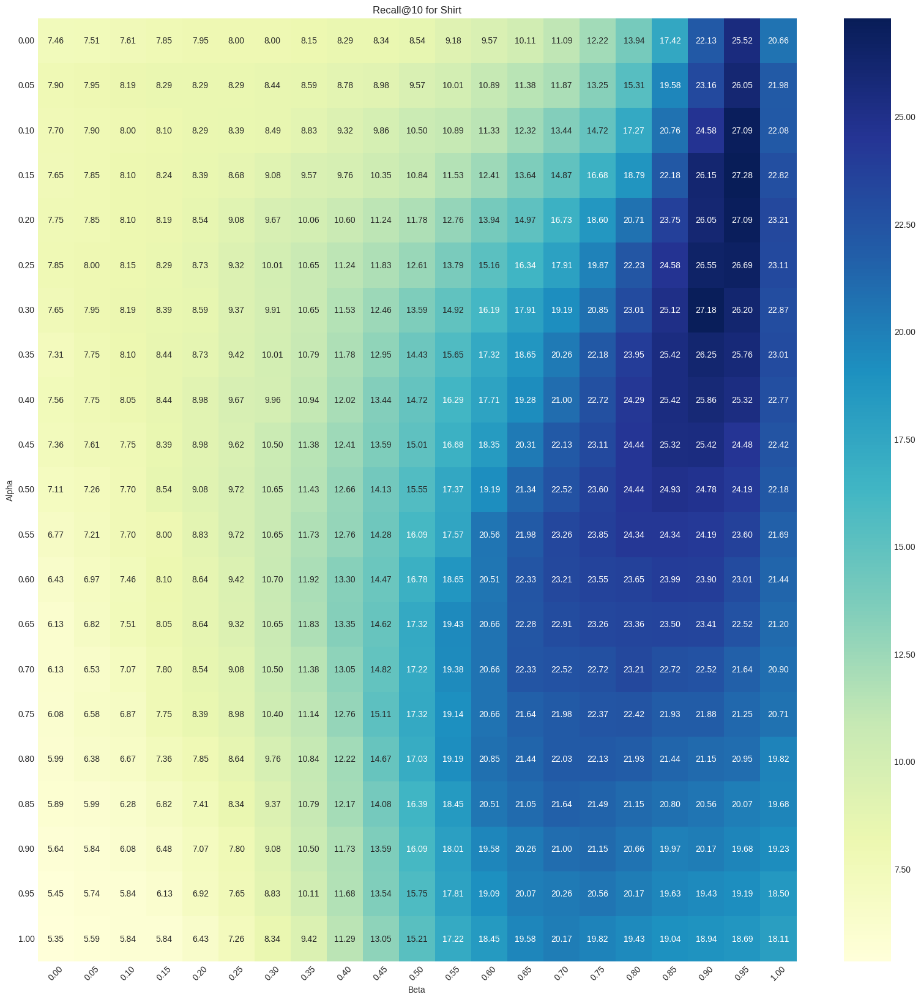

In [29]:
prepare_and_plot_recall_pivot(shirt_recall_at10, "Recall@10 for Shirt")

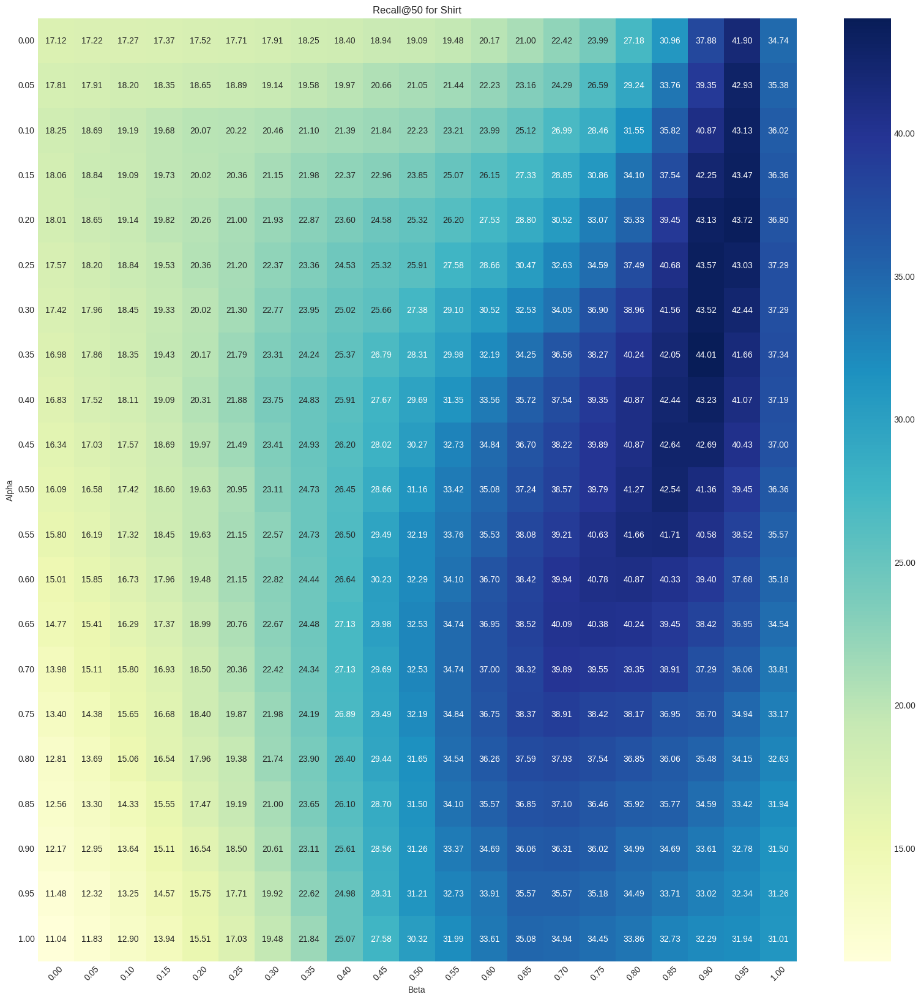

In [30]:
prepare_and_plot_recall_pivot(shirt_recall_at50, "Recall@50 for Shirt")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for Dress</div>

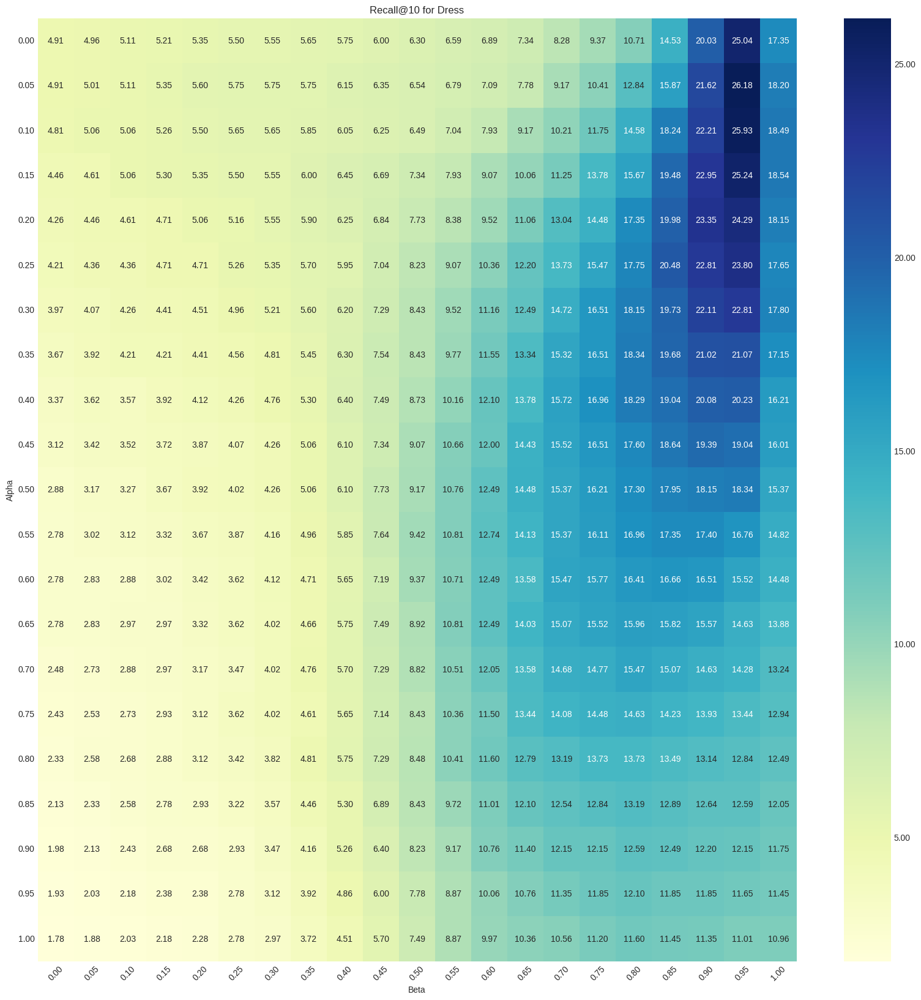

In [31]:
prepare_and_plot_recall_pivot(dress_recall_at10, "Recall@10 for Dress")

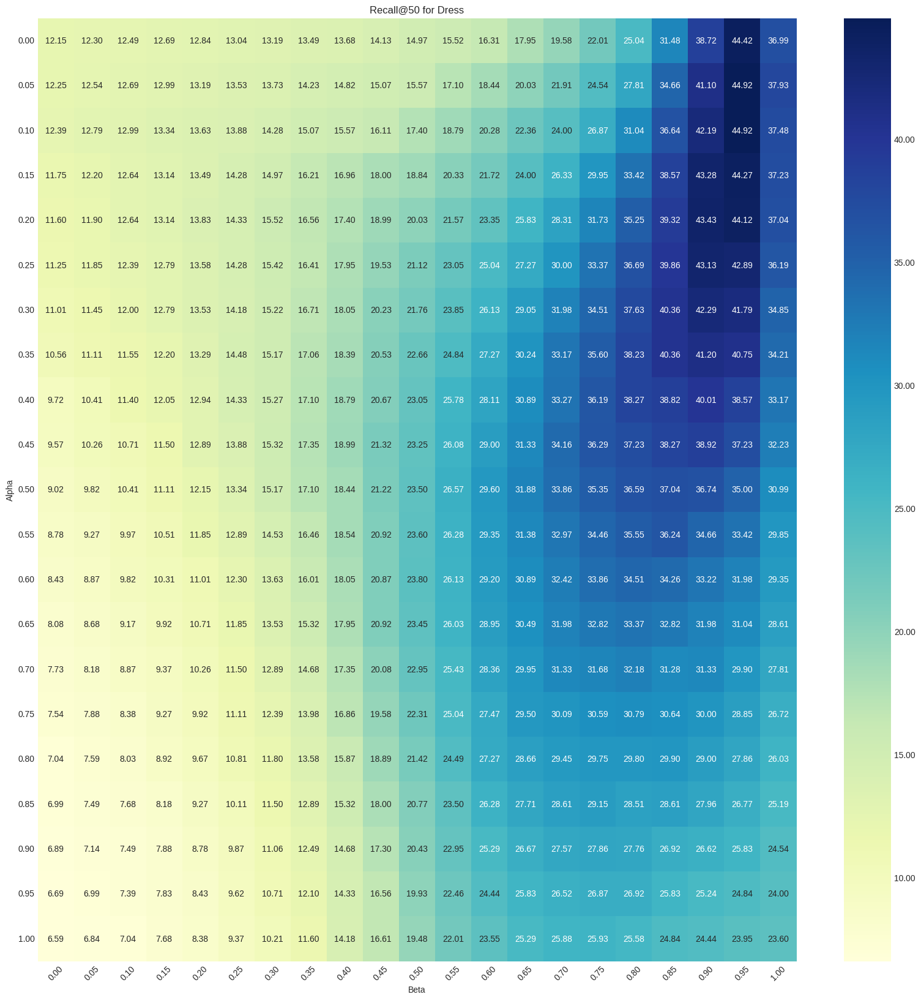

In [32]:
prepare_and_plot_recall_pivot(dress_recall_at50, "Recall@50 for Dress")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall at 10 and 50 for TopTee</div>

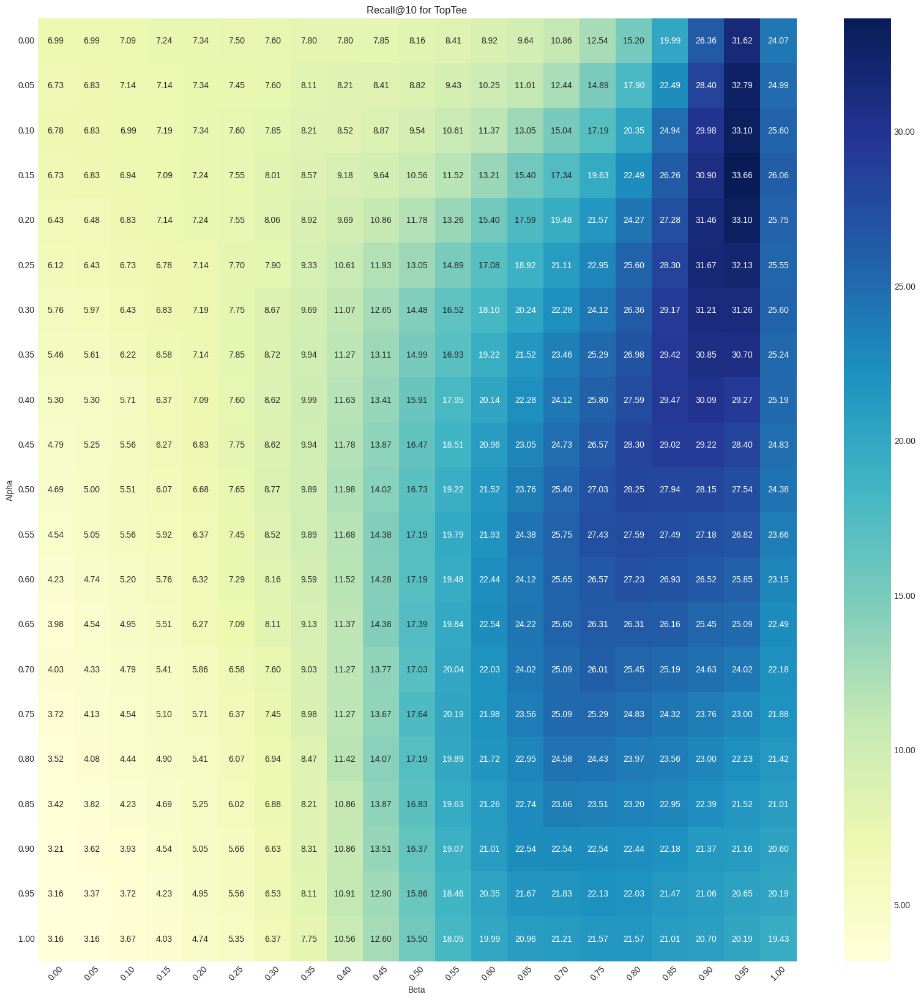

In [33]:
prepare_and_plot_recall_pivot(toptee_recall_at10, "Recall@10 for TopTee")

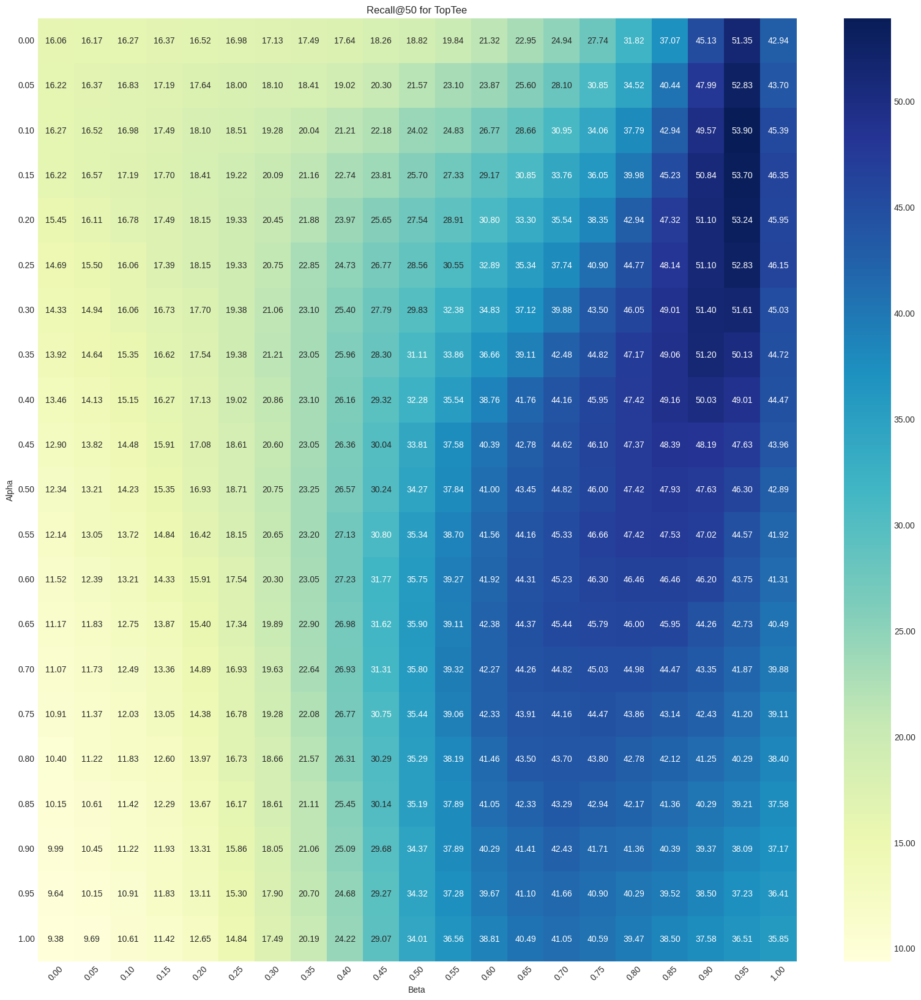

In [34]:
prepare_and_plot_recall_pivot(toptee_recall_at50, "Recall@50 for TopTee")

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the average recall at 10 and 50 for all categories</div>

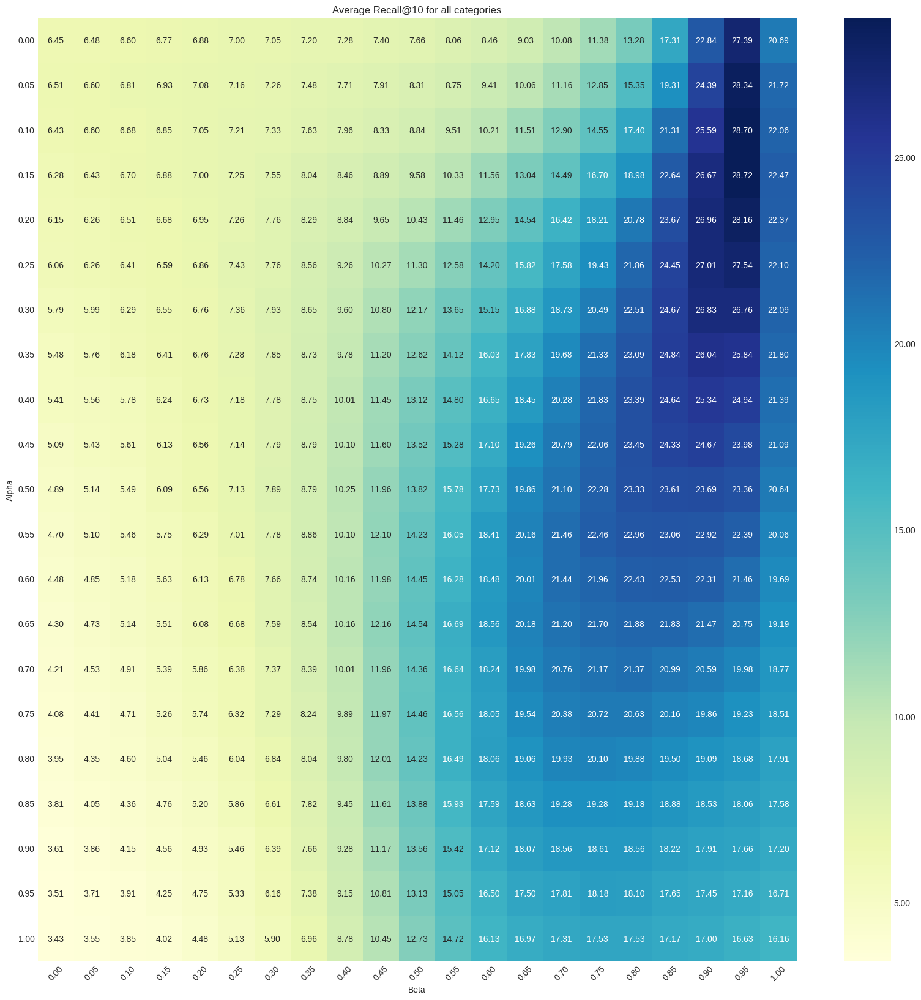

In [35]:
prepare_and_plot_recall_pivot(average_recall_at10, "Average Recall@10 for all categories")

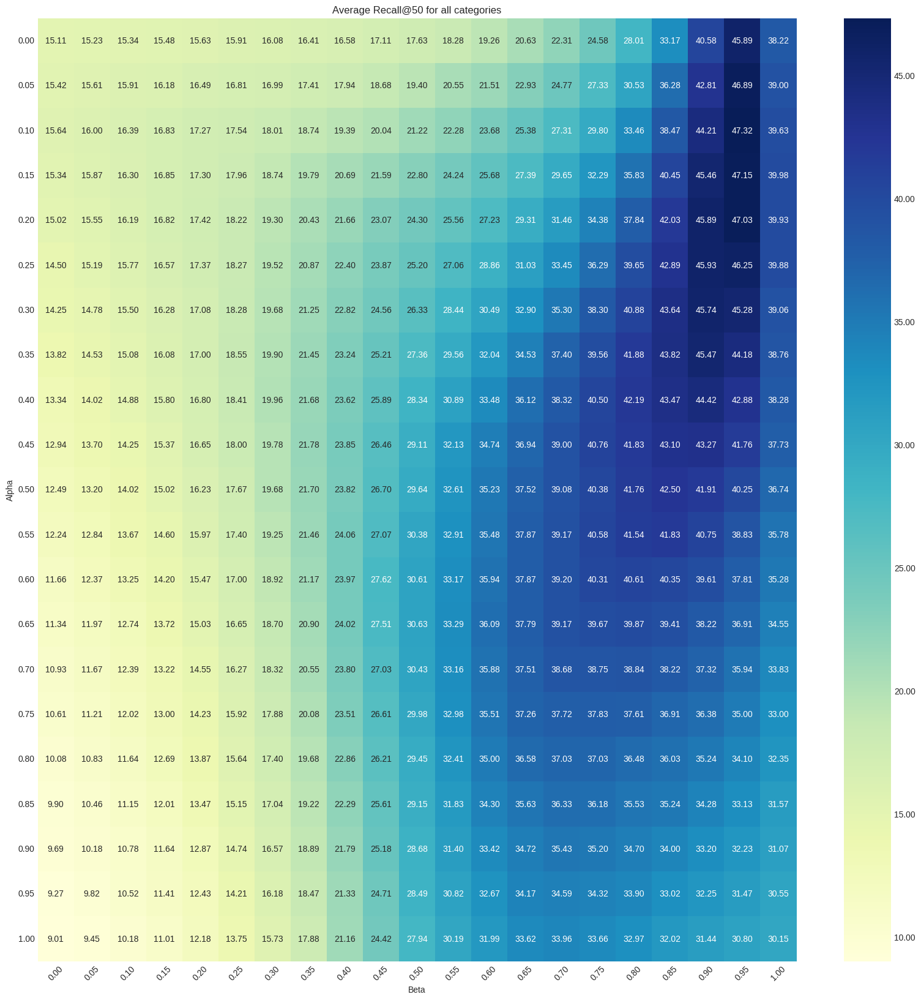

In [36]:
prepare_and_plot_recall_pivot(average_recall_at50, "Average Recall@50 for all categories")

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Define the function to compute the results</div>

In [37]:
def compute_results(
    dress_type: str,
    combining_function: callable,
    blip_text_encoder: torch.nn.Module,
    blip_img_encoder: torch.nn.Module,
    text_captions: List[dict],
    preprocess: callable,
    alpha: float = 0.65
)-> Tuple[torch.tensor, List[str], List[str]]:
    """
    View sample results on FashionIQ dataset combining text and image distances.
    
    :param dress_type: FashionIQ category on which perform the retrieval
    :param combining_function:function which takes as input (image_features, text_features) and outputs the combined features
    :param blip_text_encoder: BLIP text model
    :param blip_img_encoder: BLIP image model
    :param text_captions: text captions for the FashionIQ dataset
    :param preprocess: preprocess pipeline
    :param alpha: alpha value for combining text and image distances
    
    :return: [(image_path, text_caption, candidate_image_paths)]
    """
    blip_text_encoder = blip_text_encoder.float().eval()
    blip_img_encoder = blip_img_encoder.float().eval()
    
    # Define the validation datasets and extract the index features
    classic_val_dataset = FashionIQDataset('val', [dress_type], 'classic', preprocess)
    
    multiple_text_index_features, multiple_text_index_names = [], []
    
    for i in range(3):
        index_features, index_names, _ = extract_index_features_with_text_captions(
            classic_val_dataset,
            blip_text_encoder,
            text_captions,
            i + 1
        )
        multiple_text_index_features.append(index_features)
        multiple_text_index_names.append(index_names)
    
    image_index_features, image_index_names = extract_index_features(classic_val_dataset, blip_img_encoder)
    
    relative_val_dataset = FashionIQDataset('val', [dress_type], 'relative', preprocess)
    
    all_text_distances = []
    
    # Compute distances for individual text features
    for text_features, text_names in zip(multiple_text_index_features, multiple_text_index_names):
        # Generate text predictions and normalize features
        predicted_text_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                                             combining_function, text_names,
                                                                             text_features)
        # Normalize features
        text_features = F.normalize(text_features, dim=-1)
        predicted_text_features = F.normalize(predicted_text_features, dim=-1)

        # Compute cosine similarity and convert to distance
        cosine_similarities = torch.mm(predicted_text_features, text_features.T)
        distances = 1 - cosine_similarities
        all_text_distances.append(distances)

    predicted_image_features, target_names = generate_fiq_val_predictions(blip_text_encoder, relative_val_dataset,
                                                               combining_function, image_index_names,
                                                               image_index_features)

    # Normalize and compute distances
    image_index_features = F.normalize(image_index_features, dim=-1).float()
    image_distances = 1 - predicted_image_features @ image_index_features.T

    # Merge text distances
    merged_text_distances = torch.mean(torch.stack(all_text_distances), dim=0)
    
    merged_distances = alpha * merged_text_distances + (1 - alpha) * image_distances
    
    sorted_indices = torch.argsort(merged_distances, dim=-1).cpu()
    sorted_index_names = np.array(image_index_names if image_index_names else multiple_text_index_names[0])[sorted_indices]
    labels = torch.tensor(
        sorted_index_names == np.repeat(np.array(target_names), len(image_index_names if image_index_names else multiple_text_index_names[0])).reshape(len(target_names), -1))
    assert torch.equal(torch.sum(labels, dim=-1).int(), torch.ones(len(target_names)).int())
    recall_at10 = (torch.sum(labels[:, :10]) / len(labels)).item() * 100
    recall_at50 = (torch.sum(labels[:, :50]) / len(labels)).item() * 100
    
    print(f"Recall at 10: {recall_at10}")
    print(f"Recall at 50: {recall_at50}")
        
    return sorted_indices, image_index_names, target_names

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category</div>

In [38]:
sorted_indices_dress, image_index_names_dress, target_names_dress = compute_results(
    'dress',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:34<00:00,  3.52it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 21:43:17.932723] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 55.04it/s]


[2024-05-12 21:43:19.104195] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.87it/s]


[2024-05-12 21:43:20.322533] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.16it/s]


[2024-05-12 21:43:21.511093] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.80it/s]


Recall at 10: 24.293504655361176

Recall at 50: 44.12493705749512

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category</div>

In [39]:
sorted_indices_shirt, image_index_names_shirt, target_names_shirt = compute_results(
    'shirt',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:04<00:00,  3.10it/s]


FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 21:45:17.702242] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.95it/s]


[2024-05-12 21:45:18.945026] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.65it/s]


[2024-05-12 21:45:20.194080] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.09it/s]


[2024-05-12 21:45:21.432804] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 51.07it/s]


Recall at 10: 27.085378766059875

Recall at 50: 43.71933341026306

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category</div>

In [40]:
sorted_indices_toptee, image_index_names_toptee, target_names_toptee = compute_results(
    'toptee',
    get_combing_function_with_beta(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0.2
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:53<00:00,  3.13it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 21:47:03.091255] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 51.09it/s]


[2024-05-12 21:47:04.315383] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 57.42it/s]


[2024-05-12 21:47:05.403989] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 58.86it/s]


[2024-05-12 21:47:06.467088] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 55.64it/s]


Recall at 10: 33.095359802246094

Recall at 50: 53.23814153671265

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [41]:
def prepare_ground_truths(json_data):
    """
    Prepare ground truth data from the JSON structure.
    
    :param json_data: JSON data containing target and candidate matches with captions
    :return: Dictionary mapping targets to lists of tuples (candidates and captions)
    """
    ground_truths = {}
    for entry in json_data:
        target = entry['target']
        candidate = entry['candidate']
        captions = entry['captions']
        if target not in ground_truths:
            ground_truths[target] = []
        ground_truths[target].append((candidate, captions))  # Store as a tuple
    return ground_truths

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the retrieval results for a query</div>

In [42]:
def plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truths, top_k=5, i=0):
    """
    Plot retrieval results for a specific query showing the query and its top retrieved images, highlighting ground truths
    and displaying associated captions to the left of the query image.

    :param sorted_indices: 2D tensor or array with sorted indices of retrieved images per query.
    :param image_index_names: List of image paths corresponding to indices in sorted_indices.
    :param target_names: List of names or descriptions for each query.
    :param ground_truths: Dictionary mapping target names to lists of tuples (candidates and captions).
    :param top_k: Number of top retrieved results to display per query.
    :param i: Index of the query to display.
    """
    query_index = i
    retrival_result_images = [image_index_names[j] for j in sorted_indices[query_index]][:top_k]
    ground_truth_target = target_names[query_index]
    query_img_path, query_captions = ground_truths.get(ground_truth_target, [('', '')])[0]

    fig = plt.figure(figsize=(30, 5))
    gs = GridSpec(1, top_k + 2, figure=fig)
    query_img = Image.open(f'../fashionIQ_dataset/images/{query_img_path}.png')

    # Subplot for the caption text to the left of the query image
    ax_text = fig.add_subplot(gs[0, 0])
    query_name = query_img_path
    query_captions = '\n'.join(sentences for sentences in query_captions)
    ax_text.text(0.5, 0.5, query_captions, va='center', ha='center')
    ax_text.axis('off')

    # Subplot for the query image
    ax_image = fig.add_subplot(gs[0, 1])
    ax_image.imshow(query_img)
    ax_image.set_title(f"Query: {query_name}", color='blue')
    ax_image.axis('off')

    for j, img_path in enumerate(retrival_result_images):
        img = Image.open(f'../fashionIQ_dataset/images/{img_path}.png')

        ax_result = fig.add_subplot(gs[0, j + 2])
        ax_result.imshow(img)

        # Check if this image is a ground truth and retrieve its captions
        if img_path == ground_truth_target:
            ax_result.set_title(f"{img_path}", color='green')
        else:
            ax_result.set_title(img_path)

        ax_result.axis('off')

    plt.tight_layout()
    plt.show()

In [43]:
ground_truth_dress = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.dress.val.json')))
ground_truth_shirt = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.shirt.val.json')))
ground_truth_toptee = prepare_ground_truths(json.load(open('../fashionIQ_dataset/captions/cap.toptee.val.json')))

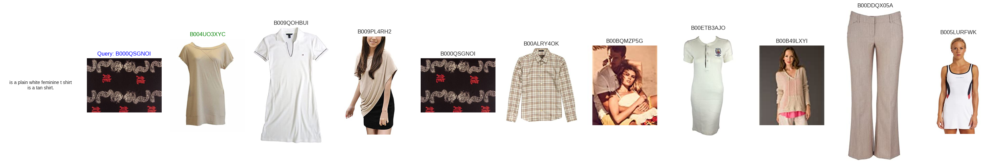

In [44]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=3)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with alpha=0 (Same as the original BLIP4CIR)</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Dress category with alpha=0</div>

In [45]:
sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin = compute_results(
    'dress',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['dress'] dataset in classic mode initialized


100%|██████████| 120/120 [00:37<00:00,  3.17it/s]

FashionIQ val - ['dress'] dataset in relative mode initialized


[2024-05-12 21:48:18.563643] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.74it/s]


[2024-05-12 21:48:19.833148] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 52.37it/s]


[2024-05-12 21:48:21.062651] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.57it/s]


[2024-05-12 21:48:22.339457] Compute FashionIQ ['dress'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 50.58it/s]


Recall at 10: 6.29647970199585

Recall at 50: 14.972731471061707

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the Shirt category with alpha=0</div>

In [46]:
sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin = compute_results(
    'shirt',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['shirt'] dataset in classic mode initialized


100%|██████████| 199/199 [01:02<00:00,  3.18it/s]

FashionIQ val - ['shirt'] dataset in relative mode initialized


[2024-05-12 21:50:15.888484] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.38it/s]


[2024-05-12 21:50:17.076761] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.37it/s]


[2024-05-12 21:50:18.263547] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 54.38it/s]


[2024-05-12 21:50:19.449879] Compute FashionIQ ['shirt'] validation predictions

100%|██████████| 64/64 [00:01<00:00, 53.20it/s]


Recall at 10: 8.537781983613968

Recall at 50: 19.08733993768692

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results for the TopTee category with alpha=0</div>

In [47]:
sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin = compute_results(
    'toptee',
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    alpha=0
)

FashionIQ val - ['toptee'] dataset in classic mode initialized


100%|██████████| 168/168 [00:47<00:00,  3.52it/s]

FashionIQ val - ['toptee'] dataset in relative mode initialized


[2024-05-12 21:51:52.703421] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 52.39it/s]


[2024-05-12 21:51:53.898503] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 57.16it/s]


[2024-05-12 21:51:54.990770] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 58.20it/s]


[2024-05-12 21:51:56.064278] Compute FashionIQ ['toptee'] validation predictions

100%|██████████| 62/62 [00:01<00:00, 40.12it/s]


Recall at 10: 8.159102499485016

Recall at 50: 18.816930055618286

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [48]:
def found_better_than_original(
        sorted_indices_origin, image_index_names_origin, target_names_origin,
        sorted_indices, image_index_names, target_names, top_k=10
) -> List[int]:
    """
    Return indices of queries where the new retrieval results are better than the original results based on the rank
    of the ground truth in the top_k results.

    Args:
        sorted_indices_origin (np.ndarray): 2D array of sorted indices by relevance per query for the original method.
        image_index_names_origin (List[str]): List of image names corresponding to indices in sorted_indices_origin.
        target_names_origin (List[str]): List of names or descriptions for each query for the original method.
        sorted_indices (np.ndarray): 2D array of sorted indices by relevance per query for the new method.
        image_index_names (List[str]): List of image names corresponding to indices in sorted_indices.
        target_names (List[str]): List of target names each query is supposed to retrieve.
        top_k (int): Number of top retrieved results to consider per query.

    Returns:
        List[int]: List of indices where the new method outperforms the original method in terms of the rank of the
        ground truth target.
    """
    better_indices = []
    total_queries = len(target_names)  # Assuming the same number of queries for both sets

    for index in range(total_queries):
        # Find the index of the ground truth in the top_k results of the original method
        new_rank = [image_index_names[i] for i in sorted_indices[index]].index(target_names[index])
        origin_rank = [image_index_names_origin[i] for i in sorted_indices_origin[index]].index(target_names_origin[index])

        if new_rank <= top_k < origin_rank:
            better_indices.append(index)

    return better_indices

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Dress category</div>

In [49]:
become_better = found_better_than_original(
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    top_k=10
)

len(become_better), become_better[:10]

(439, [1, 3, 4, 19, 27, 30, 33, 34, 38, 52])

In [50]:
become_worse = found_better_than_original(
    sorted_indices_dress, image_index_names_dress, target_names_dress,
    sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(61, [61, 109, 169, 215, 218, 308, 352, 459, 496, 520])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the Shirt category</div>

In [51]:
become_better = found_better_than_original(
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    top_k=10
)

len(become_better), become_better[:10]

(464, [1, 6, 8, 13, 16, 19, 20, 21, 24, 32])

In [52]:
become_worse = found_better_than_original(
    sorted_indices_shirt, image_index_names_shirt, target_names_shirt,
    sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(75, [5, 10, 84, 117, 134, 138, 150, 174, 183, 187])

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results for the TopTee category</div>

In [53]:
become_better = found_better_than_original(
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    top_k=10
)

len(become_better), become_better[:10]

(576, [2, 3, 4, 7, 9, 10, 13, 18, 20, 24])

In [54]:
become_worse = found_better_than_original(
    sorted_indices_toptee, image_index_names_toptee, target_names_toptee,
    sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(61, [0, 63, 117, 176, 216, 241, 256, 292, 377, 378])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Dress category</div>

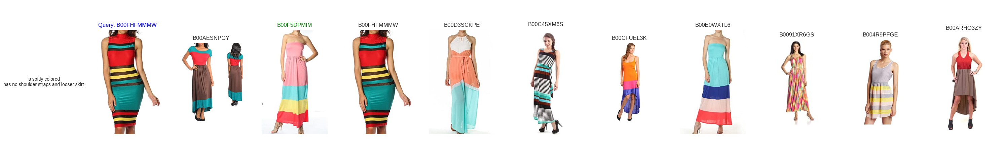

In [55]:
plot_retrieval_results_of_i(sorted_indices_dress, image_index_names_dress, target_names_dress, ground_truth_dress, top_k=10, i=11)

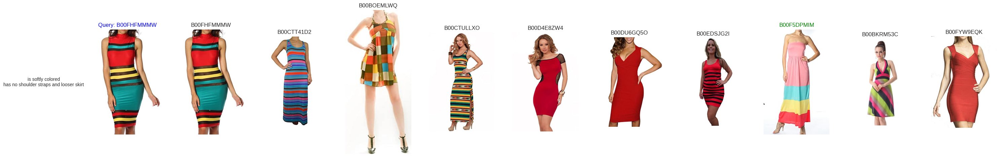

In [56]:
plot_retrieval_results_of_i(sorted_indices_dress_origin, image_index_names_dress_origin, target_names_dress_origin, ground_truth_dress, top_k=10, i=11)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the Shirt category</div>

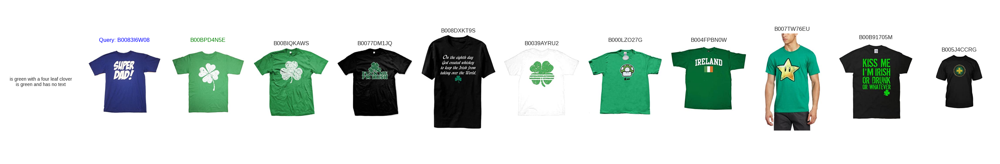

In [57]:
plot_retrieval_results_of_i(sorted_indices_shirt, image_index_names_shirt, target_names_shirt, ground_truth_shirt, top_k=10, i=1)

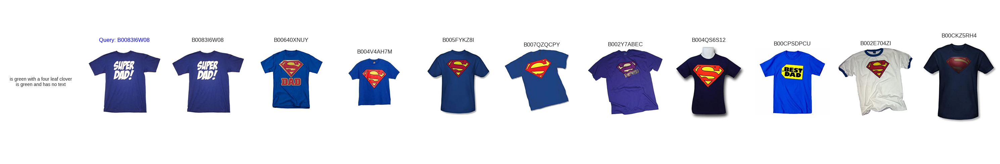

In [58]:
plot_retrieval_results_of_i(sorted_indices_shirt_origin, image_index_names_shirt_origin, target_names_shirt_origin, ground_truth_shirt, top_k=10, i=1)

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the results for the TopTee category</div>

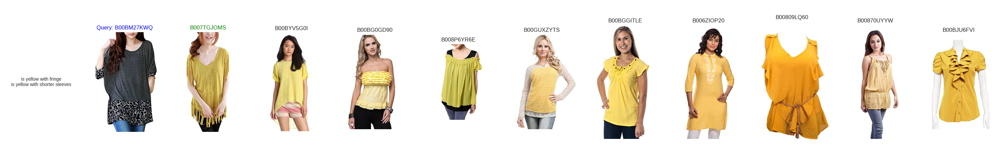

In [59]:
plot_retrieval_results_of_i(sorted_indices_toptee, image_index_names_toptee, target_names_toptee, ground_truth_toptee, top_k=10, i=2)

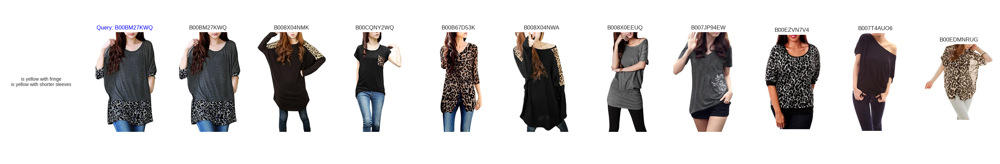

In [60]:
plot_retrieval_results_of_i(sorted_indices_toptee_origin, image_index_names_toptee_origin, target_names_toptee_origin, ground_truth_toptee, top_k=10, i=2)